# **Assignment 1 - Image Captioning**

<div style="border: 3px solid #222; padding: 16px; border-radius: 10px; background-color: #1c1f26; font-family: 'Helvetica Neue', Helvetica, Arial, sans-serif; color: #e0e0e0;">
  <div style="display: flex; align-items: center; gap: 8px; margin-top: 12px;">
    <span style="font-size: 24px; color: #ff5555;">&#128274;</span>
    <span style="font-size: 16px;"><strong>Project:</strong> Assignments</span>
  </div>
  <div style="display: flex; align-items: center; gap: 8px; margin-top: 8px;">
    <span style="font-size: 20px; color: #ff5555;">&#128218;</span>
    <span style="font-size: 16px;"><strong>Course:</strong> Deep Network Development</span>
  </div>
  <div style="margin-top: 12px; font-size: 14px;">
    <span style="font-size: 18px; color: #6e8192;">&#128100;</span>
    <span style="font-weight: bold;"><strong>Authors:</strong></span> Tamás Takács, Imre Molnár (PhD students, Department of Artificial Intelligence, Eötvös Loránd University)
  </div>
</div>
<hr style="border: none; border-top: 2px solid #444;">
<br>

<img src="https://repository-images.githubusercontent.com/83958320/8f162500-8ace-11e9-94ee-0b86d27bbc5e" alt="1" border="0">

This notebook contains the required task for the **first assignment** of the **Deep Network Development (DNDEG)** course. Read the task description carefully and **fill in the empty code cells**.

# **Task Description**

Your task is to train your **own custom image captioning model** and compare its performance with an existing **pre-trained** model. You will work with the `Flickr8k` [dataset](https://www.kaggle.com/datasets/adityajn105/flickr8k), ensuring it is properly split into **training, validation,** and **test** sets. The model should follow an **Encoder-Decoder + Attention** structure, where the encoder can use a **pre-trained backbone** such as *ResNet*, but it must be **fine-tuned**. An **attention layer** is required to visualize what the network has learned. After training, you will **evaluate and compare** the performance of your model against a **pre-trained** one, analyzing the **generated captions** and the **attention mechanisms**.

The `Flickr8k` dataset consists of **8000 images**, each paired with **5 captions**, resulting in a total of **40,000 captions**. It is your **design choice** how you implement the **dataset and batching process**. A common approach is to treat each caption as a separate data point, yielding **40,000 datapoints** in total.

The **tokenization process** is also up to you. Since the dataset contains a vast vocabulary, it may include words that appear only once. To improve model efficiency, it is **good practice to limit the vocabulary size**.

During **validation and testing**, every image has **5 reference captions**. To ensure a robust `BLEU` **score calculation**, it is recommended to compute `BLEU` scores using **all 5 matching captions** as reference captions for each image.

# **Expectations**

- Your model is **not expected to achieve state-of-the-art performance**, but it should perform **better than random guessing**. The **loss should decrease** throughout training, and the model’s performance should be monitored to prevent overfitting or underfitting.

- You will work with the `Flickr8k` dataset, which should be split into **train, validation, and test** sets. The `training` set is used to train the image captioning model, the `validation` set helps fine-tune hyperparameters and monitor performance, and the `test` set is used for final evaluation.

- To assess model performance, include **visualizations of loss values** and **evaluation metrics** for the dataset splits.

- You are free to choose any **pre-trained model** (`blip`, `vit-gpt2-flickr8k`, etc.) for model comparison at the end.

# **Requirements**

- Data Preparation and Visualization:
  - Ensure the **Flickr8k dataset** is correctly split into **train, validation, and test sets**.
  - Display **sample images with their original captions**.
  - Visualize **tokenized captions** to ensure proper preprocessing.

- Model Training and Performance Monitoring:
  - Train an **Encoder-Decoder + Attention** model using the training set.
  - Track **training and validation loss** using visualizations (e.g., `Matplotlib`, `Seaborn`).
  - Monitor **BLEU-1, BLEU-2, BLEU-3, and BLEU-4 scores** for a greedy decoder throughout training.

- Implement **techniques to avoid overfitting**, such as:
    - **Early stopping** to halt training when validation loss stops improving.
    - **Regularization** (e.g., dropout, weight decay) to improve generalization.
    - **Experimenting with different loss functions** to find the most effective approach.
    - **Saving the best-performing model** during training for later evaluation.

- Model Comparison:
  - Evaluate and compare your **custom-trained model** with a **pre-trained model** on the same batch of test images.
  - **Visualize generated captions** and compare them to ground-truth captions.
  - Compute **BLEU scores** using all five reference captions for a given image.
  - Analyze and explain the **strengths and weaknesses** of both models based on performance differences.

- Optionally, use **WandB (Weights and Biases)** or **TensorBoard** to:
  - Track and visualize **training progress**.
  - Monitor **model performance** over time.
  - Log **key metrics**.

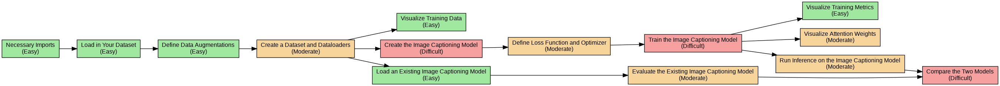

In [ ]:
# @title Image Captioning Tasks
# %%capture flowchart_output
# HIDDEN CELL
from graphviz import Digraph
from IPython.display import Image as IMG

def create_flowchart(output_filename='flowchart'):
    dot = Digraph(name='Simplified Object Detection', format='png')
    dot.attr(rankdir='LR')
    dot.attr('node', shape='box', style='filled', fontsize='12', fontname='Arial')

    dot.node('Imports', 'Necessary Imports\n(Easy)', fillcolor='#A0E7A0')

    dot.node('LoadData', 'Load in Your Dataset\n(Easy)', fillcolor='#A0E7A0')

    dot.node('AugmentData', 'Define Data Augmentations\n(Easy)', fillcolor='#A0E7A0')

    dot.node('DatasetDataloader', 'Create a Dataset and Dataloaders\n(Moderate)', fillcolor='#F6D49A')

    dot.node('VisualizeSample', 'Visualize Training Data\n(Easy)', fillcolor='#A0E7A0')
    dot.node('CreateModel', 'Create the Image Captioning Model\n(Difficult)', fillcolor='#F6A0A0')

    dot.node('Hyperparameters', 'Define Loss Function and Optimizer\n(Moderate)', fillcolor='#F6D49A')

    dot.node('TrainModel', 'Train the Image Captioning Model\n(Difficult)', fillcolor='#F6A0A0')

    dot.node('VisualizeTrain', 'Visualize Training Metrics\n(Easy)', fillcolor='#A0E7A0')
    dot.node('VisualizeAtt', 'Visualize Attention Weights\n(Moderate)', fillcolor='#F6D49A')
    dot.node('RunInference', 'Run Inference on the Image Captioning Model\n(Moderate)', fillcolor='#F6D49A')

    dot.node('LoadModel', 'Load an Existing Image Captioning Model\n(Easy)', fillcolor='#A0E7A0')

    dot.node('EvaluateModel', 'Evaluate the Existing Image Captioning Model\n(Moderate)', fillcolor='#F6D49A')

    dot.node('Comparison', 'Compare the Two Models\n(Difficult)', fillcolor='#F6A0A0')

    # Edges
    dot.edge('Imports', 'LoadData')

    dot.edge('LoadData', 'AugmentData')

    dot.edge('AugmentData', 'DatasetDataloader')

    dot.edge('DatasetDataloader', 'CreateModel')
    dot.edge('DatasetDataloader', 'VisualizeSample')

    dot.edge('CreateModel', 'Hyperparameters')
    dot.edge('Hyperparameters', 'TrainModel')
    dot.edge('TrainModel', 'VisualizeTrain')
    dot.edge('TrainModel', 'VisualizeAtt')
    dot.edge('TrainModel', 'RunInference')

    dot.edge('DatasetDataloader', 'LoadModel')
    dot.edge('LoadModel', 'EvaluateModel')
    dot.edge('RunInference', 'Comparison')
    dot.edge('EvaluateModel', 'Comparison')

    dot.render(output_filename, view=False)

create_flowchart('assignment1_flowchart')
IMG('assignment1_flowchart.png')

Each section of the Notebook will guide you through the task:

- `necessary imports`
- `data loading process`
- `defining data augmentations`
- `creating a dataset and dataloaders`
- `visualizing the training data`
- `creating a CNN model`
- `creating a FCN model`
- `defining a loss function and an optimizer`
- `creating a training and validation loop`
- `testing the models`
- `comparing results`
- `visualizing weights and feature maps`

The sections are there to guide you but you **do not have to follow them strictly**.

Copy this notebook to your drive (`File -> Save a copy in Drive`), edit it, and upload the final `.ipynb` file to [Canvas](https://canvas.elte.hu). If you are using this in **Google Colab**, save it as `.ipynb` and upload it, or share the public link. If you have your own machine with Jupyter installed, you can work there as well, as long as you save and upload the `.ipynb` file.

## **General Rules**
Please check all the requirements listed on **Canvas**, but here are some general rules:

- The model is **not expected to achieve high performance** but must perform better than random color guessing.
- Copying others' code will make you fail the assignment automatically, resulting in a **0**.
- Not submitting anything results in a **0**.
- Submitting something, as long as it is not an empty notebook, might result in a 1.
- **Deadline is November 25th Tuesday 11:59 PM** (strict, no late submission)
- Feel free to add more code cells as needed. But don't put code into external Python files.
- Please add your `name` and `Neptun ID` below.

`Good luck!`

**In order to get your grade for an assignment, you must defend it by answering questions during the designated practice time.**

## **Guidelines**
Please carefully read each cell of the notebook, as they contain guidelines to help you complete the assignments. While you don't have to follow them strictly, we believe that they provide enough help.

**Name:**  Alexander Girutskiy

**Neptun ID:** K3JAXN

## **0. Necessary Imports**
Import all the necessary packages for this assignment. **ONLY PYTORCH MODELS ARE ACCEPTED!**

In [ ]:
import os
import torch
import nltk
import torchvision
import torchaudio
import matplotlib.pyplot as plt
import random
from torch.utils.data import Dataset, DataLoader
from PIL import Image
from torchvision import transforms
from nltk.corpus import stopwords
import re
from collections import Counter
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
import timm
import random


nltk.download('stopwords')
device = torch.device("cuda:0") if torch.cuda.is_available() else torch.device("cpu")
DND_DIRECTORY = ''

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


## **1. Data Loading Process**

For this assignment you will be using the [Flickr8k](https://www.kaggle.com/datasets/adityajn105/flickr8k) dataset, which contains **captions/descriptions** of different images.

<img src="https://user-images.githubusercontent.com/38347541/56469847-9faa0780-645c-11e9-822a-11a15bb56f5b.png" alt="1" border="0">

The best way to download this dataset is through `Kaggle`. First **create a token**, download it and upload it here. Follow [these](https://www.kaggle.com/discussions/general/74235) steps.

In [ ]:
!pip install -q kaggle

In [ ]:
from google.colab import  drive
drive.mount('/content/drive')
DND_DIRECTORY = '/content/drive/MyDrive/MSC/DND/AS1'

Mounted at /content/drive


In [ ]:
!mkdir ~/.kaggle
!cp /content/drive/MyDrive/MSC/DND/AS1/kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json
!kaggle datasets list

ref                                                             title                                                     size  lastUpdated                 downloadCount  voteCount  usabilityRating  
--------------------------------------------------------------  --------------------------------------------------  ----------  --------------------------  -------------  ---------  ---------------  
sadiajavedd/students-academic-performance-dataset               Students_Academic_Performance_Dataset                     8907  2025-10-23 04:16:35.563000           6586        169  1.0              
ayeshaimran123/social-media-and-mental-health-balance           Social Media and Mental Health Balance                    5941  2025-10-26 07:51:53.380000           6661         91  1.0              
shahzadi786/world-smartphone-market-2025                        World Smartphone Market 2025                             17795  2025-11-09 04:52:42.650000           2705         73  1.0              


In [ ]:
#!/bin/bash
!kaggle datasets download adityajn105/flickr8k

Dataset URL: https://www.kaggle.com/datasets/adityajn105/flickr8k
License(s): CC0-1.0
 91% 967M/1.04G [00:00<00:00, 1.69GB/s]
100% 1.04G/1.04G [00:00<00:00, 1.68GB/s]


In [ ]:
!mkdir flickr8k
!unzip -q flickr8k.zip -d flickr8k

In [ ]:
!head -n 10 flickr8k/captions.txt

image,caption
1000268201_693b08cb0e.jpg,A child in a pink dress is climbing up a set of stairs in an entry way .
1000268201_693b08cb0e.jpg,A girl going into a wooden building .
1000268201_693b08cb0e.jpg,A little girl climbing into a wooden playhouse .
1000268201_693b08cb0e.jpg,A little girl climbing the stairs to her playhouse .
1000268201_693b08cb0e.jpg,A little girl in a pink dress going into a wooden cabin .
1001773457_577c3a7d70.jpg,A black dog and a spotted dog are fighting
1001773457_577c3a7d70.jpg,A black dog and a tri-colored dog playing with each other on the road .
1001773457_577c3a7d70.jpg,A black dog and a white dog with brown spots are staring at each other in the street .
1001773457_577c3a7d70.jpg,Two dogs of different breeds looking at each other on the road .


## **2. Defining Augmentations**

When applying **augmentations** to the `Flickr8k` dataset, it is important to note that these transformations should be applied **only to the images** and not to the captions.

Ensure that your **data augmentation pipeline** includes:
- A **normalization step** to scale pixel values appropriately.
- A **tensor conversion step** to transform images into tensors for model compatibility.
- Additional **augmentations of your choice**, such as random cropping, flipping, or color jittering, to enhance model generalization.

```python
train_transforms = transforms.Compose([
            # Add Augmentations
])

test_transforms = transforms.Compose([
            # Add Augmentations
])
```

In [ ]:
mean = [0.485, 0.456, 0.406]
std = [0.229, 0.224, 0.225]


train_transforms = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(mean, std),
    transforms.RandomRotation(degrees=20),
    transforms.RandomHorizontalFlip(p=.25),
    transforms.RandomVerticalFlip(p=0.25)
])

test_transforms = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(mean, std)
])

## **3. Creating Datasets and Dataloaders**

To load the **Flickr8k** dataset, you need to create a **custom PyTorch** `Dataset` class that returns **images and their corresponding captions**. The captions should be **tokenized** before being returned.

Make sure to include special tokens in your tokenized captions:
- `sos` (Start of Sentence)
- `eos` (End of Sentence)
- `unk` (Unknown Token) for words outside the vocabulary.

It is recommended to build a **Vocabulary class** to store all the words in your dataset, as your model can only generate words that exist in this vocabulary. However, saving every word is unnecessary. A **common practice** is to include only words that appear **at least 5 times** across the entire dataset to reduce noise and improve model efficiency.

For the **DataLoader**, ensure that the **batch size** is appropriate so that it fits into memory. Set the **`shuffle`** parameter as follows:

- **Training & Validation DataLoaders:** `shuffle=True` (to randomize the order of samples)  
- **Test DataLoader:** `shuffle=False` (to maintain consistency in evaluation)

> **Note**: Remember that, a batch has **different examples**, and each example (caption) might have **different sizes**. Therefore, consider padding techniques for the captions.

```python
class FlickrDataset(Dataset):
    def __init__(self,):
        raise NotImplementedError

    def __len__(self):
        raise NotImplementedError

    def __getitem__(self, idx):
        raise NotImplementedError
```

In [ ]:
data_path = 'flickr8k/captions.txt'
df = pd.read_csv(data_path)
df.head(5)

,image,caption
0,1000268201_693b08cb0e.jpg,A child in a pink dress is climbing up a set o...
1,1000268201_693b08cb0e.jpg,A girl going into a wooden building .
2,1000268201_693b08cb0e.jpg,A little girl climbing into a wooden playhouse .
3,1000268201_693b08cb0e.jpg,A little girl climbing the stairs to her playh...
4,1000268201_693b08cb0e.jpg,A little girl in a pink dress going into a woo...


In [ ]:
grouped_df = df.groupby('image')['caption'].agg(list).reset_index() # combine captions to lists for the same image
print(f"number of images in dataset: {grouped_df.shape[0]}")
grouped_df.head(5)

number of images in dataset: 8091


,image,caption
0,1000268201_693b08cb0e.jpg,[A child in a pink dress is climbing up a set ...
1,1001773457_577c3a7d70.jpg,"[A black dog and a spotted dog are fighting, A..."
2,1002674143_1b742ab4b8.jpg,[A little girl covered in paint sits in front ...
3,1003163366_44323f5815.jpg,[A man lays on a bench while his dog sits by h...
4,1007129816_e794419615.jpg,[A man in an orange hat starring at something ...


In [ ]:
train_samples, rest = train_test_split(grouped_df, random_state=42, test_size=0.3)
val_samples, test_samples = train_test_split(rest, random_state=42, test_size=0.5)

print(f"number of training: %d, validation: %d, testing images: %d" %
 (train_samples.shape[0], val_samples.shape[0], test_samples.shape[0]))

number of training: 5663, validation: 1214, testing images: 1214


In [ ]:
class Vocab:
    def __init__(self, min_num=5):
        self.SOS_token = '<sos>'    # start of sentence
        self.EOS_token = '<eos>'    # end of sentence
        self.UNK_token = '<unk>'    # unknown token
        self.PAD_token = '<pad>'    # padding token

        self.PAD_idx = 0
        self.SOS_idx = 1
        self.EOS_idx = 2
        self.UNK_idx = 3


        self.index2word = {
            self.SOS_idx: self.SOS_token,
            self.EOS_idx: self.EOS_token,
            self.UNK_idx: self.UNK_token,
            self.PAD_idx: self.PAD_token
        }
        self.word2index = {word: idx for idx, word in self.index2word.items()}
        self.min_num = min_num
        self.found_words = {}

    def preprocess_string(self, s):
        """
        Cleans the input string by removing HTML <br> tags, punctuation, digits,
        and extra whitespace.
        """
        # Remove <br> tags
        s = re.sub(r'<br\s*/?>', ' ', s)
        # Remove all non-word characters (except whitespace)
        s = re.sub(r"[^\w\s]", '', s)
        # Remove digits
        s = re.sub(r"\d", '', s)
        # Replace multiple whitespaces with a single space and strip leading/trailing spaces
        s = re.sub(r"\s+", ' ', s).strip()
        return s

    def add_sentence(self, sentence):
        if not sentence: return
        if not isinstance(sentence, str): sentence = str(sentence) # will correct it anyway
        sentence = self.preprocess_string(sentence)
        words = sentence.split()
        max_len = len(words)
        for word in words:
            word_len = self.add_word(word)

        return max_len

    def add_word(self, word):
        """
        Adds a single word to the vocabulary if it's not already present.

        Args:
            word (str): The word to add.
        """
        if word not in self.found_words:
            self.found_words[word] = 1
        else:
            self.found_words[word] += 1
            if self.found_words[word] >= self.min_num and word not in self.word2index:
                idx = len(self.index2word)
                self.word2index[word] = idx
                self.index2word[idx] = word

    def __len__(self):
        assert len(self.index2word) == len(self.word2index), "Mappings are inconsistent."
        return len(self.index2word)

    def decode_words(self, indices):
        """
        Converts a list of indices into their corresponding words.

        Args:
            indices (list or iterable): List of word indices.

        Returns:
            list: List of words corresponding to the indices. Unknown indices are replaced with UNK_token.
        """
        return [self.index2word.get(i, self.UNK_token) for i in indices]

    def __repr__(self):
        return f"Vocab(size={len(self)}, special_tokens={list(self.index2word.values())[:4]})"

In [ ]:
# go over the original dataset and collect all the words into the vocabulary

vocabulary = Vocab()

max_word_num = 0
for _, row in df.iterrows():
    sent_len = vocabulary.add_sentence(row['caption'])
    max_word_num = max(max_word_num, sent_len)

In [ ]:
class FlickrDataset(Dataset):
    def __init__(self, df, vocabulary, images_path, transf, max_word_num):
        self.images = []
        self.captions = []
        self.vocab = vocabulary
        self.df = df.copy()
        self.transf = transf
        self.max_word_num = max_word_num
        for _, row in self.df.iterrows():
            im_name = row['image']
            im_path = os.path.join(images_path, im_name)
            captions = row['caption']
            for caption in captions:
                self.images.append(im_path)
                self.captions.append(caption)

    def __len__(self):
        assert len(self.images) == len(self.captions), "Image, captions number mismatch"
        return len(self.images)

    def tokenise_caption(self, caption):
        caption = self.vocab.preprocess_string(caption)
        caption_words = caption.split()
        caption_words = [word if word in self.vocab.word2index else self.vocab.UNK_token for word in caption_words]
        if len(caption_words) > self.max_word_num:
            caption_words = caption_words[:self.max_word_num]
        caption_words = [self.vocab.SOS_token] + caption_words + [self.vocab.EOS_token]
        while len(caption_words) < self.max_word_num + 2: # for the <sos> and <eos> tokens
            caption_words.append(self.vocab.PAD_token)

        tokenised_caption = [self.vocab.word2index[word] for word in caption_words]
        return tokenised_caption

    def __getitem__(self, idx):
        # get image
        img_path = self.images[idx]
        img = Image.open(img_path).convert("RGB").resize((224,224))
        image = self.transf(img)

        # get caption
        caption = self.captions[idx]
        tokenised_caption = self.tokenise_caption(caption)
        caption_tensor = torch.tensor(tokenised_caption)
        return image, caption_tensor


In [ ]:
img_path = 'flickr8k/Images'

train_dataset = FlickrDataset(
    train_samples,
    vocabulary,
    img_path,
    train_transforms,
    max_word_num
)

val_dataset = FlickrDataset(
    val_samples,
    vocabulary,
    img_path,
    train_transforms,
    max_word_num
)

test_dataset = FlickrDataset(
    test_samples,
    vocabulary,
    img_path,
    test_transforms,
    max_word_num
)

In [ ]:
batch_size = 128
num_workers = 1

train_loader = DataLoader(
    train_dataset,
    batch_size=batch_size,
    shuffle=True,
    num_workers=num_workers
)

val_loader = DataLoader(
    val_dataset,
    batch_size=batch_size,
    shuffle=True,
    num_workers=num_workers
)

test_loader = DataLoader(
    test_dataset,
    batch_size=batch_size,
    shuffle=False,
    num_workers=num_workers
)

## **4.1 Visualizing Training Data**

To visualize the training data, extract a batch from the training `DataLoader` and plot the **input-target** pairs using `Matplotlib` or `Seaborn`. Ensure that at least **8 pairs** are displayed for a clear representation.

Make sure to **visualize the original and the tokenized caption** as well!

```python
def visualize_batch():
  raise NotImplementedError
```

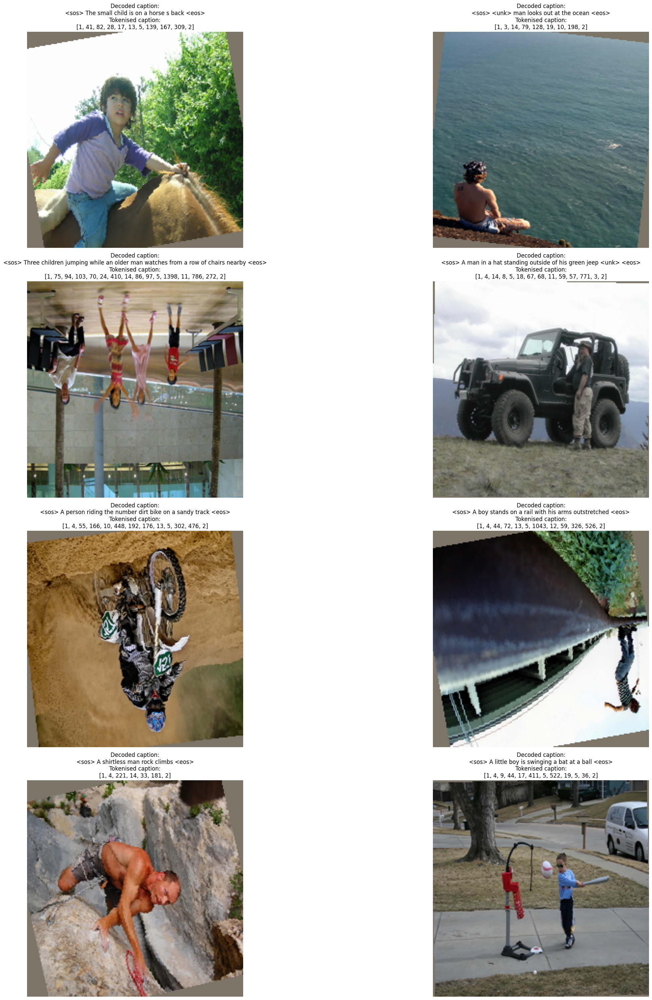

In [ ]:
def decode_caption(tokenised_caption, vocabulary):
    caption = []
    for token in tokenised_caption:
        caption.append(vocabulary.index2word[int(token)])
    return " ".join(caption)

def denormalize(tensor, mean, std):
    mean = torch.tensor(mean, device=tensor.device).view(-1, 1, 1)
    std  = torch.tensor(std,  device=tensor.device).view(-1, 1, 1)

    return tensor * std + mean


def visualise_batch(dataloader, vocabulary, num_images=8, mean=(.5,.5,.5), std=(.5,.5,.5)):
    images, captions = next(iter(dataloader))
    if num_images % 2 == 1:
        num_images += 1

    fig, axs = plt.subplots(num_images//2,2, figsize=(30,30))
    axs = axs.flatten()

    for plot_idx in range(num_images):
        img = images[plot_idx]
        caption =  captions[plot_idx]
        caption = caption.tolist()
        caption = [token for token in caption if token != vocabulary.PAD_idx]
        decoded_caption = decode_caption(caption, vocabulary)


        img = denormalize(img, mean, std)       # unnormalize since it was normalized during loading
        img = img.clamp(0, 1)
        img_np = np.transpose(img, (1, 2, 0))   # [C, H, W] -> [H, W, C]

        axs[plot_idx].imshow(img_np)
        axs[plot_idx].axis('off')
        axs[plot_idx].set_title(f'Decoded caption:\n{decoded_caption}\nTokenised caption:\n{caption}')
    plt.tight_layout()
    plt.show()

visualise_batch(train_loader, vocabulary, 8, mean, std)

## **4.2 Creating the Image Captioning Model**

For this assignment, **you are required to create your own custom image captioning model** and **compare its performance** with an existing pre-trained model.

---

### **Encoder-Attention-Decoder Architecture**

Your model should follow an **Encoder-Attention-Decoder** structure with the following components:

- The **Encoder** processes images to extract meaningful features. You can either design a **custom convolutional architecture** or use a **pre-trained model** like *ResNet*, but **fine-tuning is required** to adapt the features to the captioning task.
- The **Attention Layer** acts as an interface between the encoder and decoder. It leverages the extracted image features to compute **attention scores**, helping the decoder focus on relevant parts of the image during caption generation. For simplicity, use **Linear layers** to implement the attention mechanism.
- The **Decoder** is a sequence-based model (e.g., *LSTM*) that processes the image features and generates captions sequentially.

---

#### **Extra Credit Opportunity**
- Additional points will be awarded for implementing either a **Vision Transformer (ViT) encoder** or a **Transformer-based decoder** instead of an LSTM.

Here is an example of something similar to what we want to create:
<img src="https://drive.google.com/thumbnail?id=1wdddaLit7iEyCcVy5bS505NiYzL6c-4x&sz=w1000">

```python
class Encoder(nn.Module):
    def __init__(self):
        super(Encoder, self).__init__()
        return NotImplementedError

    def forward(self, images):
        return NotImplementedError
```

```python
class Attention(nn.Module):
    def __init__(self, encoder_dim,decoder_dim,attention_dim):
        super(Attention, self).__init__()
        return NotImplementedError

    def forward(self, features, hidden_state):
        return NotImplementedError
```

```python
class Decoder(nn.Module):
    def __init__(self, embed_size, vocab_size, attention_dim, encoder_dim, decoder_dim):
        return NotImplementedError

    def forward(self, features, captions):
        return NotImplementedError
```
```python
class EncoderDecoder(nn.Module):
    def __init__(self,embed_size, vocab_size, attention_dim, encoder_dim,decoder_dim):
        return NotImplementedError

    def forward(self, images, captions):
        return NotImplementedError
```

In [ ]:
import timm

class ViTEncoder(nn.Module):
    def __init__(self, encoder_dim=768, fine_tune=False):
        super(ViTEncoder, self).__init__()

        self.vit = timm.create_model('vit_base_patch16_224', pretrained=True)
        self.encoder_dim = encoder_dim
        self.enc_proj = nn.Linear(768, encoder_dim)
        # remove classification head
        self.vit.reset_classifier(0)

        # Fine-tune flag
        for p in self.vit.parameters():
            p.requires_grad = fine_tune

    def forward(self, images):
        # images: [B, 3, 224, 224]
        patch_tokens = self.vit.forward_features(images)[:,1:,:]  # [B, num_patches, 768]
        patch_tokens = self.enc_proj(patch_tokens)               # [B, num_patches, 512]
        return patch_tokens

In [ ]:
class Attention(nn.Module):
    def __init__(self, encoder_dim, decoder_dim, attention_dim):
        super().__init__()

        self.encoder_att = nn.Linear(encoder_dim, attention_dim)  # W_v
        self.decoder_att = nn.Linear(decoder_dim, attention_dim)  # W_h
        self.full_att    = nn.Linear(attention_dim, 1)            # vᵀ
        self.relu        = nn.ReLU()
        self.softmax     = nn.Softmax(dim=1)  # over num_pixels

    def forward(self, encoder_out, decoder_hidden):
        """
        encoder_out: [B, num_pixels, encoder_dim]
        decoder_hidden: [B, decoder_dim]

        returns:
            context: [B, encoder_dim]
            alpha:   [B, num_pixels]
        """
        att1 = self.encoder_att(encoder_out)                  # [B, num_pixels, attention_dim]
        att2 = self.decoder_att(decoder_hidden).unsqueeze(1)  # [B, 1, attention_dim]
        att  = self.full_att(self.relu(att1 + att2)).squeeze(2)  # [B, num_pixels]

        alpha = self.softmax(att)                             # [B, num_pixels]
        context = (encoder_out * alpha.unsqueeze(2)).sum(dim=1)   # [B, encoder_dim]

        return context, alpha


In [ ]:
class Decoder(nn.Module):
    def __init__(
        self,
        embed_size,
        vocab_size,
        attention_dim,
        encoder_dim,
        decoder_dim,
        dropout=0.5
    ):
        super().__init__()

        self.encoder_dim  = encoder_dim
        self.decoder_dim  = decoder_dim
        self.vocab_size   = vocab_size
        self.embed_size   = embed_size

        # Attention module
        self.attention = Attention(encoder_dim, decoder_dim, attention_dim)

        # Embedding for words
        self.embedding = nn.Embedding(vocab_size, embed_size)

        # LSTMCell takes word embedding + context vector
        self.decode_step = nn.LSTMCell(embed_size + encoder_dim, decoder_dim)

        # Initialize LSTM hidden state from image
        self.init_h = nn.Linear(encoder_dim, decoder_dim)
        self.init_c = nn.Linear(encoder_dim, decoder_dim)

        # Gate scalar on context
        self.f_beta = nn.Linear(decoder_dim, encoder_dim)
        self.sigmoid = nn.Sigmoid()

        self.fc = nn.Linear(decoder_dim, vocab_size)
        self.dropout = nn.Dropout(dropout)

    def init_hidden_state(self, encoder_out):
        # encoder_out: [B, num_pixels, encoder_dim]
        mean_enc = encoder_out.mean(dim=1)          # [B, encoder_dim]
        h = self.init_h(mean_enc)                   # [B, decoder_dim]
        c = self.init_c(mean_enc)                   # [B, decoder_dim]
        return h, c

    def forward(self, encoder_out, captions):
        """
        encoder_out: [B, num_pixels, encoder_dim]
        captions:    [B, max_len]  (already tokenized/padded)

        Returns:
            preds:  [B, max_len, vocab_size]
            alphas: [B, max_len, num_pixels]
        """
        batch_size = encoder_out.size(0)
        num_pixels = encoder_out.size(1)
        max_len    = captions.size(1)

        # Embed all target words
        embeddings = self.embedding(captions)  # [B, max_len, embed_size]

        # Init LSTM state
        h, c = self.init_hidden_state(encoder_out)

        preds  = torch.zeros(batch_size, max_len, self.vocab_size, device=encoder_out.device)
        alphas = torch.zeros(batch_size, max_len, num_pixels,       device=encoder_out.device)

        for t in range(max_len):
            emb_t = embeddings[:, t, :]              # [B, embed_size]

            # Compute attention over image
            context, alpha = self.attention(encoder_out, h)  # [B, encoder_dim], [B, num_pixels]

            # Optional gate
            gate = self.sigmoid(self.f_beta(h))      # [B, encoder_dim]
            context = gate * context                 # [B, encoder_dim]

            # LSTM step
            lstm_input = torch.cat([emb_t, context], dim=1)
            h, c = self.decode_step(lstm_input, (h, c))  # both [B, decoder_dim]

            # Predict next word
            preds[:, t, :] = self.fc(self.dropout(h))  # [B, vocab_size]
            alphas[:, t, :] = alpha

        return preds, alphas


In [ ]:
class EncoderDecoder(nn.Module):
    def __init__(self,embed_size, vocab_size, attention_dim, encoder_dim, decoder_dim):
        super(EncoderDecoder, self).__init__()

        self.encoder = ViTEncoder(encoder_dim=encoder_dim, fine_tune=False)
        self.decoder = Decoder(
            embed_size,
            vocab_size,
            attention_dim,
            encoder_dim,
            decoder_dim,
            dropout=0.5
        )

    def forward(self, images, captions):
        encoder_out = self.encoder(images)          # [B, num_pixels, encoder_dim]
        preds, alphas = self.decoder(encoder_out, captions)
        return preds, alphas

In [ ]:
embed_size      = 256
vocab_size      = len(vocabulary)
attention_dim   = 256
encoder_dim     = 512
decoder_dim     = 512

model = EncoderDecoder(embed_size, vocab_size, attention_dim, encoder_dim, decoder_dim).to(device)

In [ ]:
dummy_images = torch.randn(16, 3, 224, 224).to(device)

vocab_size = len(vocabulary)
dummy_captions = torch.randint(0, vocab_size, (16, max_word_num)).to(device)
print(f"{max_word_num=}, {vocab_size=}")

print(f"Image batch: {dummy_images.shape}\nCaption batch: {dummy_captions.shape}")

model.eval()
with torch.no_grad():
    outputs, alphas = model(dummy_images, dummy_captions)
print(f"Model outputs: {outputs.shape}\nAttention maps: {alphas.shape}")

max_word_num=35, vocab_size=3096
Image batch: torch.Size([16, 3, 224, 224])
Caption batch: torch.Size([16, 35])
Model outputs: torch.Size([16, 35, 3096])
Attention maps: torch.Size([16, 35, 196])


## **5. Defining Loss Function and Optimizer**

**Loss Functions and their options:**

In an **image captioning task**, the model generates a sequence of words conditioned on an image. This involves both **sequence generation (language modeling)** and **image understanding**, making loss selection crucial for effective training. The primary loss function should optimize **word prediction** while ensuring **grammatical correctness and semantic coherence**.

Since our task involves **predicting discrete word tokens**, we typically use **sequence-based loss functions**, but we can also explore loss functions that account for **semantic meaning** and **alignment**.

---

### **a. Cross-Entropy Loss (Standard Sequence Prediction Loss)**  
The most common loss for text generation tasks is **Cross-Entropy Loss**, which measures the difference between the **predicted word probability distribution** and the **true word** in the sequence. It is computed as:

$$
\mathcal{L}_{CE} = -\sum_{t=1}^{T} y_t \log(\hat{y}_t)
$$

where:
- $T $ is the sequence length (number of words in the caption),
- $ y_t $ is the **ground truth word** (one-hot encoded),
- $ \hat{y}_t $ is the **predicted probability** of that word.

- **Pros:** Simple, well-established for text generation tasks, easy to implement.
- **Cons:** Treats each word prediction independently, ignoring sentence-level meaning, but useful during `teacher forcing`.

---

### **b. CIDER Loss (Reinforcement Learning-Based Caption Quality Loss)**  
Cross-Entropy loss focuses on **token-level** accuracy, but it does not capture **sentence-level fluency and meaning**. CIDER (Consensus-based Image Description Evaluation) helps optimize captions towards human-like descriptions.

$$
\mathcal{L}_{CIDEr} = 1 - CIDEr(\hat{Y}, Y)
$$

where $ CIDEr(\hat{Y}, Y) $ measures how similar the generated caption $ \hat{Y} $ is to multiple reference captions $ Y $.

- **Pros:** Optimizes for caption similarity to human references, improves fluency. Best suited for **fine-tuning after pretraining with Cross-Entropy** Loss.
- **Cons:** Harder to optimize, requires reinforcement learning.

---

### **c. Reinforcement Learning-Based Loss (REINFORCE with Self-Critical Sequence Training - SCST)**  
Since captioning is **sequential**, we can treat it as a reinforcement learning problem. Instead of directly predicting words, we train the model to maximize **rewards** (e.g., BLEU or CIDEr scores). This is done using the **REINFORCE** algorithm:

$$
\mathcal{L}_{RL} = - (r(\hat{Y}) - r(\bar{Y})) \sum_{t=1}^{T} \log P(y_t | y_{1:t-1}, X)
$$

where:
- $ r(\hat{Y}) $ is the reward for the generated caption,
- $ r(\bar{Y}) $ is the baseline reward (e.g., score from a greedy decoder).

- **Pros:** Optimizes **sentence-level metrics** instead of per-word accuracy, leading to better captions.  
- **Cons:** Computationally expensive, requires careful tuning.   

---

[PyTorch Documentation](https://pytorch.org/docs/stable/nn.html#loss-functions)

---

**Optimizers and their options:**

There are some pre-built [Optimizers in PyTorch](https://pytorch.org/docs/stable/optim.html), they are sufficient in most cases, especially if their parameters are well set. The two most well-known are Adam (AdamW) and SGD, both of which originate from Gradient Descent, which we implemented earlier.

* **S**tochastic **G**radient **D**escent ([SGD](https://pytorch.org/docs/stable/generated/torch.optim.SGD.html))
* **ADA**ptive **M**oment optimizer ([ADAM](https://pytorch.org/docs/stable/generated/torch.optim.Adam.html))
* [A good general overview](https://www.ruder.io/optimizing-gradient-descent/)

## **6. Training the Image Captioning Model**

When implementing the training loop, ensure the following key aspects are included:

- Set an **appropriate number of epochs** for model training, balancing between underfitting and overfitting.
- Maintain running losses throughout each epoch and compute both **training loss** and **validation loss** per epoch.
- Implement an **early stopping mechanism** to halt training if validation loss stops improving, preventing unnecessary overfitting.
- **Save the model at its best-performing epoch** based on validation loss, ensuring the best version is retained for inference.

> **Note**: Pay attention to your choices. **Be aware of overfitting** and underfitting. Make sure the **loss is decreasing over the epochs**. Save the losses so that they can be visualized.

In [ ]:
# Define loss and optimizer
pad_idx = vocabulary.PAD_idx
criterion = nn.CrossEntropyLoss(ignore_index=pad_idx)
optimizer = torch.optim.Adam(model.parameters(), lr=1e-3)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, 'min', factor=0.5, patience=2)

num_epochs = 50
best_val_loss = float('inf')
patience = 5
trigger_times = 0

In [ ]:
train_losses = []
val_losses = []

for epoch in range(num_epochs):
    model.train()
    running_loss = 0.0

    for images, caption_tensor in train_loader:
        images = images.to(device)
        caption_tensor = caption_tensor.to(device).long()
        optimizer.zero_grad()
        features = model.encoder(images)
        loss = 0.0
        inputs = caption_tensor[:, :-1]   # all tokens except last
        targets = caption_tensor[:, 1:]   # all tokens except first
        # print(inputs.shape, targets.shape)
        outputs, _ = model.decoder(features, inputs)
        # Compute cross-entropy loss
        loss = criterion(outputs.reshape(-1, vocab_size), targets.reshape(-1))
        loss.backward()
        optimizer.step()
        running_loss += loss.item()
    avg_train_loss = running_loss / len(train_loader)
    train_losses.append(avg_train_loss)

    # Validation loop
    model.eval()
    running_val_loss = 0.0
    with torch.no_grad():
        for images, caption_tensor in val_loader:
            images = images.to(device)
            caption_tensor = caption_tensor.to(device).long()
            features = model.encoder(images)
            loss = 0.0
            inputs = caption_tensor[:, :-1]
            targets = caption_tensor[:, 1:]
            outputs, _ = model.decoder(features, inputs)
            loss += criterion(outputs.reshape(-1, vocab_size), targets.reshape(-1))
            running_val_loss += loss.item()
    avg_val_loss = running_val_loss / len(val_loader)
    scheduler.step(avg_val_loss)
    val_losses.append(avg_val_loss)

    print(f"Epoch {epoch+1}/{num_epochs}, Train Loss: {avg_train_loss:.4f}, Val Loss: {avg_val_loss:.4f}")

    # Check for improvement
    if avg_val_loss < best_val_loss:
        best_val_loss = avg_val_loss
        trigger_times = 0
    else:
        trigger_times += 1
        print(f"No improvement for {trigger_times} epoch(s).")
        if trigger_times >= patience:
            print("Early stopping triggered")
            break


MODEL_PATH = "image_caption_model.pth"
if os.path.exists(DND_DIRECTORY):
    MODEL_PATH = os.path.join(DND_DIRECTORY, MODEL_PATH)
torch.save(model.state_dict(), MODEL_PATH)

metrics_path = "training_custom_history.pt"
if os.path.exists(DND_DIRECTORY):
    metrics_path = os.path.join(DND_DIRECTORY, metrics_path)
torch.save({
    "train_losses": train_losses,
    "val_losses": val_losses
}, metrics_path)

Epoch 1/50, Train Loss: 4.4170, Val Loss: 3.5646
Epoch 2/50, Train Loss: 3.3676, Val Loss: 3.1498
Epoch 3/50, Train Loss: 3.0441, Val Loss: 2.9852
Epoch 4/50, Train Loss: 2.8568, Val Loss: 2.8911
Epoch 5/50, Train Loss: 2.7191, Val Loss: 2.8299
Epoch 6/50, Train Loss: 2.6137, Val Loss: 2.7972
Epoch 7/50, Train Loss: 2.5205, Val Loss: 2.7722
Epoch 8/50, Train Loss: 2.4393, Val Loss: 2.7571
Epoch 9/50, Train Loss: 2.3657, Val Loss: 2.7395
Epoch 10/50, Train Loss: 2.2928, Val Loss: 2.7384
Epoch 11/50, Train Loss: 2.2319, Val Loss: 2.7395
No improvement for 1 epoch(s).
Epoch 12/50, Train Loss: 2.1774, Val Loss: 2.7415
No improvement for 2 epoch(s).
Epoch 13/50, Train Loss: 2.1204, Val Loss: 2.7439
No improvement for 3 epoch(s).
Epoch 14/50, Train Loss: 2.0050, Val Loss: 2.7386
No improvement for 4 epoch(s).
Epoch 15/50, Train Loss: 1.9533, Val Loss: 2.7514
No improvement for 5 epoch(s).
Early stopping triggered


In [ ]:
MODEL_NAME = "image_caption_model.pth"

embed_size      = 256
vocab_size      = len(vocabulary)
attention_dim   = 256
encoder_dim     = 512
decoder_dim     = 512

def load_model_from_path(model_name, model_class):
    if os.path.exists(DND_DIRECTORY):
        model_path = os.path.join(DND_DIRECTORY, model_name)
    else:
        model_path = model_name
    model = model_class(embed_size, vocab_size, attention_dim, encoder_dim, decoder_dim).to(device)
    model.load_state_dict(torch.load(model_path, weights_only=True))
    return model

model = load_model_from_path(MODEL_NAME, EncoderDecoder)
model.eval()

/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


model.safetensors:   0%|          | 0.00/346M [00:00<?, ?B/s]

EncoderDecoder(
  (encoder): ViTEncoder(
    (vit): VisionTransformer(
      (patch_embed): PatchEmbed(
        (proj): Conv2d(3, 768, kernel_size=(16, 16), stride=(16, 16))
        (norm): Identity()
      )
      (pos_drop): Dropout(p=0.0, inplace=False)
      (patch_drop): Identity()
      (norm_pre): Identity()
      (blocks): Sequential(
        (0): Block(
          (norm1): LayerNorm((768,), eps=1e-06, elementwise_affine=True)
          (attn): Attention(
            (qkv): Linear(in_features=768, out_features=2304, bias=True)
            (q_norm): Identity()
            (k_norm): Identity()
            (attn_drop): Dropout(p=0.0, inplace=False)
            (norm): Identity()
            (proj): Linear(in_features=768, out_features=768, bias=True)
            (proj_drop): Dropout(p=0.0, inplace=False)
          )
          (ls1): Identity()
          (drop_path1): Identity()
          (norm2): LayerNorm((768,), eps=1e-06, elementwise_affine=True)
          (mlp): Mlp(
          

## **7.1 Visualizing Training Metrics**

- **Restore the model's parameters** from the checkpoint where validation loss was lowest to use the most optimal version of the model.
- Use `Matplotlib` or `Seaborn` to plot the loss curves over epochs.

Did your model **converge**? Explain your results!

```python
def plot_losses():
  raise NotImplementedError
```

Using in-memory loss data.


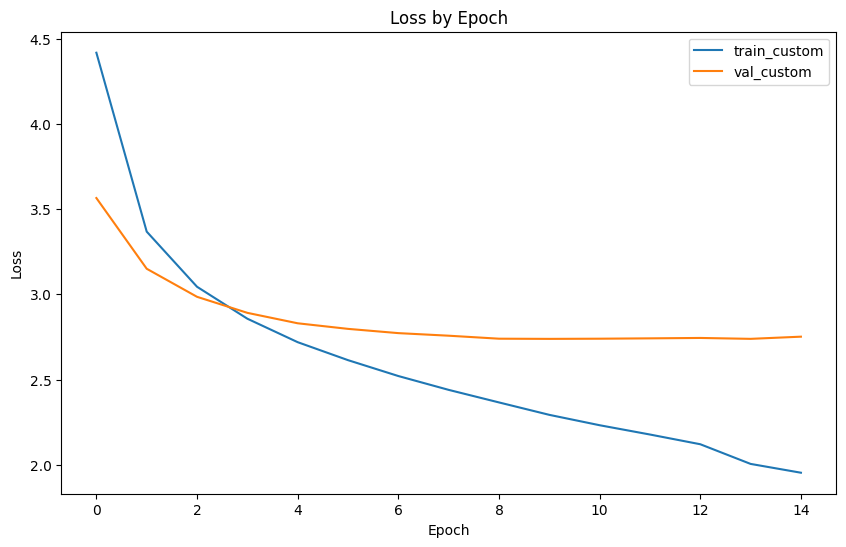

In [ ]:
REMOTE_PATH = "training_custom_history.pt"

if os.path.exists(DND_DIRECTORY):
    REMOTE_PATH = os.path.join(DND_DIRECTORY, REMOTE_PATH)
try:
    train_losses
    val_losses
    print("Using in-memory loss data.")
except NameError:
    print("train_losses not found. Loading from checkpoint...")

    if os.path.exists(REMOTE_PATH):
        checkpoint = torch.load(REMOTE_PATH, map_location="cpu")
        train_losses = checkpoint.get("train_losses", [])
        val_losses = checkpoint.get("val_losses", [])
        print(f"Loaded loss history from {REMOTE_PATH}")
    else:
        raise FileNotFoundError(f"Could not find checkpoint at {REMOTE_PATH}")

plt.figure(figsize=(10,6))
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Loss by Epoch')


plt.plot(train_losses)
plt.plot(val_losses)
plt.legend(['train_custom', 'val_custom'])
plt.show()

## **7.2 Visualizing Attention Weights**

Visualize the attention weigths in order to understand how your model learned.
For that, use the `context` variable returned by the **Attention class** to overlay them on the image.

```python
def plot_attention():
  raise NotImplementedError
```

Visualizing Attention Weights on Test Images


Image 1


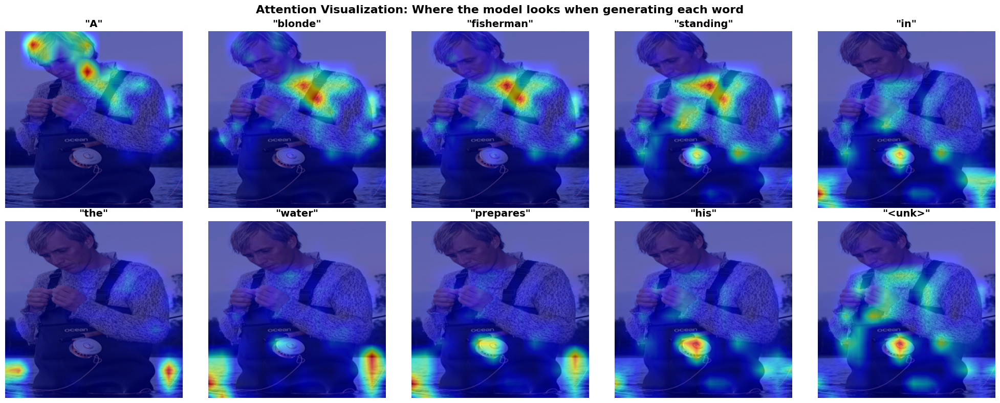


Image 2


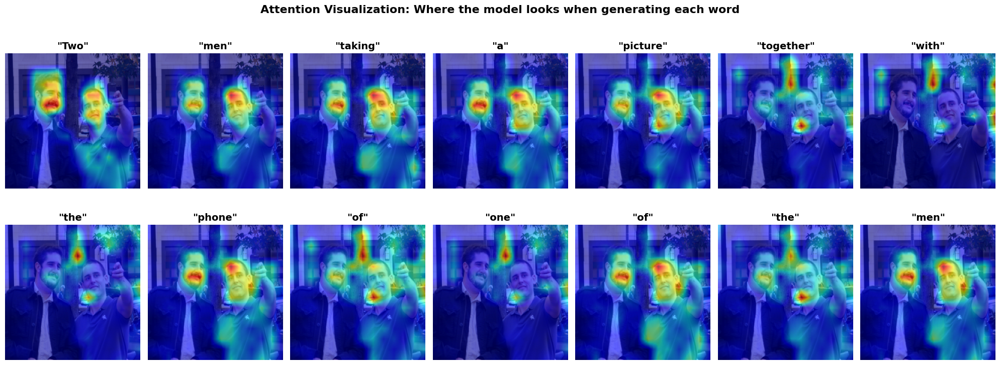


Image 3


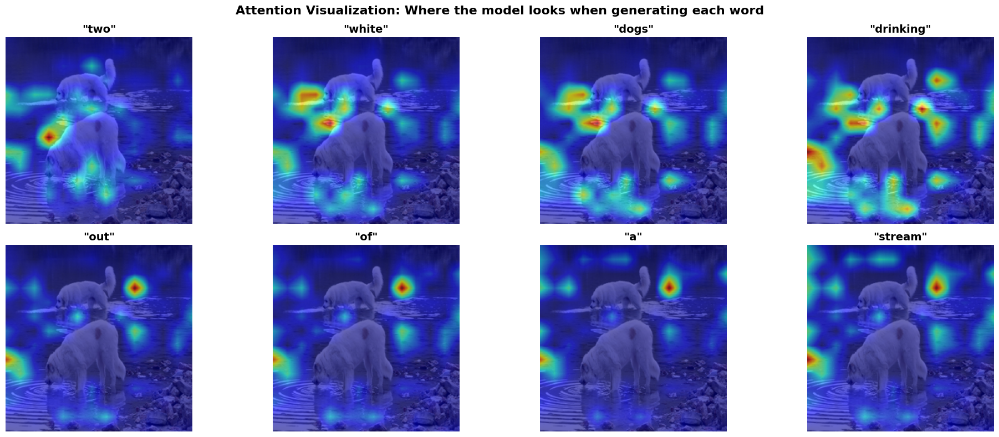

In [ ]:
def visualize_attention(model, image, caption_tensor, vocabulary, mean, std, num_words_to_show=10):
    """
    Visualize attention weights on the image for each generated word
    """
    model.eval()

    with torch.no_grad():
        # Get image features and predictions
        image_batch = image.unsqueeze(0).to(device)  # [1, 3, 224, 224]
        caption_batch = caption_tensor.unsqueeze(0).to(device)  # [1, seq_len]

        # Get encoder output and attention weights
        encoder_out = model.encoder(image_batch)  # [1, num_pixels, encoder_dim]
        preds, alphas = model.decoder(encoder_out, caption_batch)  # alphas: [1, seq_len, num_pixels]

        # Remove batch dimension
        alphas = alphas.squeeze(0).cpu().numpy()  # [seq_len, num_pixels]

        # Decode the caption
        caption_words = []
        for token in caption_tensor:
            word = vocabulary.index2word[int(token)]
            if word == vocabulary.EOS_token:
                break
            if word != vocabulary.PAD_token and word != vocabulary.SOS_token:
                caption_words.append(word)

        # Determine grid size for attention maps
        num_pixels = alphas.shape[1]
        grid_size = int(np.sqrt(num_pixels))  # Should be 14 for ViT or ResNet

        # Limit number of words to visualize
        num_words = min(len(caption_words), num_words_to_show)

        # Denormalize image
        img_denorm = denormalize(image, mean, std)
        img_denorm = img_denorm.clamp(0, 1)
        img_np = np.transpose(img_denorm.cpu().numpy(), (1, 2, 0))

        # Create visualization
        fig, axes = plt.subplots(2, num_words // 2 + num_words % 2, figsize=(20, 8))
        axes = axes.flatten()

        for i in range(num_words):
            # Get attention weights for this word (skip SOS token, so +1)
            attention = alphas[i + 1].reshape(grid_size, grid_size)

            # Resize attention map to match image size
            from scipy.ndimage import zoom
            attention_resized = zoom(attention, (224 / grid_size, 224 / grid_size), order=1)

            # Plot
            axes[i].imshow(img_np)
            axes[i].imshow(attention_resized, alpha=0.6, cmap='jet')
            axes[i].set_title(f'"{caption_words[i]}"', fontsize=14, fontweight='bold')
            axes[i].axis('off')

        # Hide unused subplots
        for i in range(num_words, len(axes)):
            axes[i].axis('off')

        plt.suptitle('Attention Visualization: Where the model looks when generating each word',
                     fontsize=16, fontweight='bold')
        plt.tight_layout()
        plt.show()


# Visualize attention for a few test images
print("Visualizing Attention Weights on Test Images\n")

num_ims = 3

# Visualize attention for first 3 images
for idx, (test_images, test_captions) in enumerate(test_loader):
    if idx >= num_ims:
        break
    print(f"\n{'='*80}")
    print(f"Image {idx + 1}")
    print('='*80)
    visualize_attention(model, test_images[idx], test_captions[idx], vocabulary, mean, std, num_words_to_show=max_word_num)


## **7.3 Running Inference on the Image Captioning Model**

Pass test images through the **custom-trained image captioning model**, then evaluate its performance on the test set. Use the **[BLEU score](https://pytorch.org/text/stable/data_metrics.html)** as the evaluation metric, implementing **BLEU-1, BLEU-2, BLEU-3, and BLEU-4**.

To improve performance on the validation and test sets, you may use **beam search decoding** instead of standard greedy decoding.  

[Beam Search](https://d2l.ai/chapter_recurrent-modern/beam-search.html) is a more sophisticated decoding algorithm that **considers multiple possible caption sequences at each time step instead of selecting the most probable word at every step (greedy decoding)**. It maintains a fixed number of candidate sequences (beam width) and expands them based on their cumulative probabilities, ultimately selecting the **most likely complete caption**.  

Using beam search can lead to **more fluent and accurate captions** by avoiding suboptimal word choices that greedy decoding might make.

```python
def test_model()
  raise NotImplementedError
```

In [ ]:
nltk.download('punkt')

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.


True


1. Visualizing predictions on sample test images:



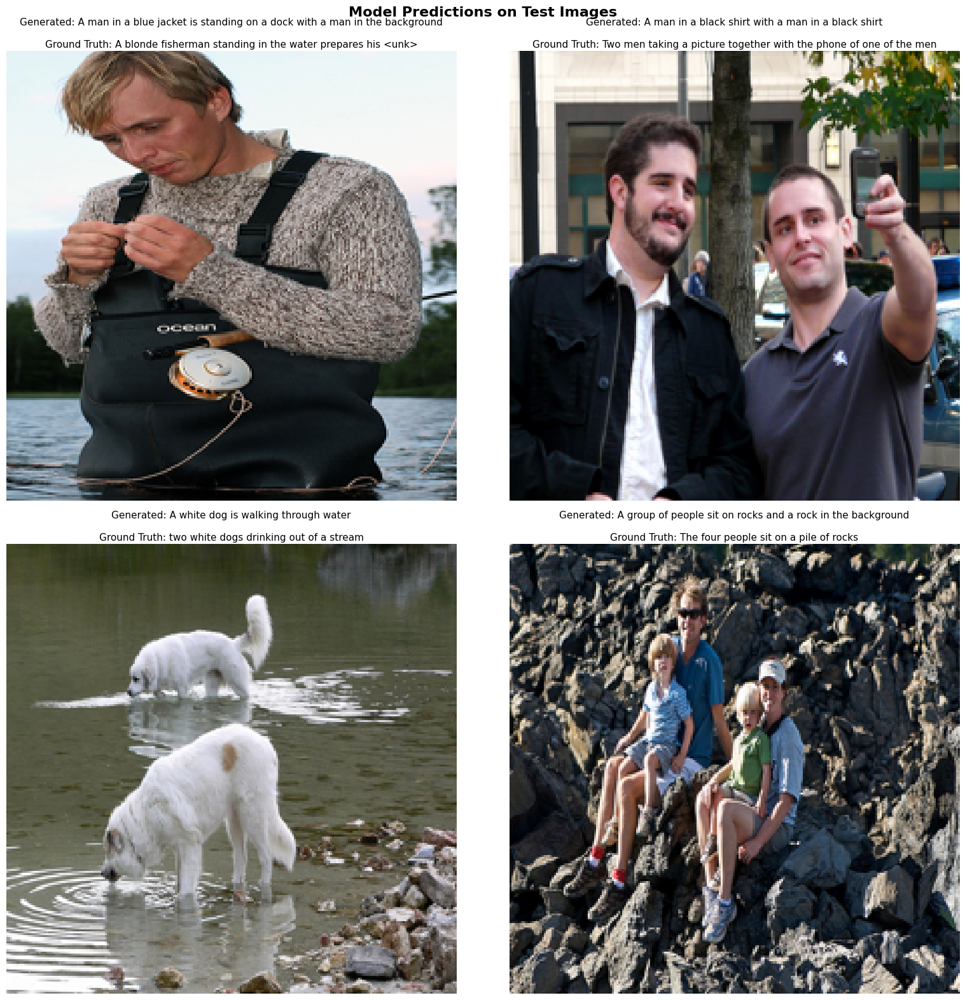


2. Evaluating model with BLEU scores:

Evaluating on test set...

Processed 50/200 images...
Processed 100/200 images...
Processed 150/200 images...
Processed 200/200 images...

TEST SET EVALUATION RESULTS
Average BLEU-1: 0.5912
Average BLEU-2: 0.4313
Average BLEU-3: 0.3044
Average BLEU-4: 0.2184


In [ ]:
from nltk.translate.bleu_score import sentence_bleu, corpus_bleu, SmoothingFunction

def greedy_decode(model, image, vocabulary, max_len=50):
    """
    Generate caption using greedy decoding

    Args:
        model: The EncoderDecoder model
        image: Image tensor [3, 224, 224]
        vocabulary: Vocabulary object
        max_len: Maximum caption length

    Returns:
        generated_caption: List of words
        attention_weights: Attention weights for visualization
    """
    model.eval()

    with torch.no_grad():
        # Encode image
        image_batch = image.unsqueeze(0).to(device)  # [1, 3, 224, 224]
        encoder_out = model.encoder(image_batch)  # [1, num_pixels, encoder_dim]

        # Initialize decoder
        batch_size = 1
        num_pixels = encoder_out.size(1)

        # Initialize hidden state
        h, c = model.decoder.init_hidden_state(encoder_out)

        # Start with SOS token
        current_word = torch.tensor([vocabulary.SOS_idx]).to(device)

        generated_words = []
        attention_weights = []

        for t in range(max_len):
            # Get embedding for current word
            embeddings = model.decoder.embedding(current_word)  # [1, embed_size]

            # Compute attention
            context, alpha = model.decoder.attention(encoder_out, h)
            attention_weights.append(alpha.cpu().numpy())

            # Gate context
            gate = model.decoder.sigmoid(model.decoder.f_beta(h))
            context = gate * context

            # LSTM step
            lstm_input = torch.cat([embeddings, context], dim=1)
            h, c = model.decoder.decode_step(lstm_input, (h, c))

            # Predict next word
            scores = model.decoder.fc(model.decoder.dropout(h))  # [1, vocab_size]
            predicted_idx = scores.argmax(dim=1).item()

            # Convert to word
            predicted_word = vocabulary.index2word.get(predicted_idx, vocabulary.UNK_token)

            # Stop if EOS token
            if predicted_word == vocabulary.EOS_token:
                break

            # Skip PAD tokens
            if predicted_word != vocabulary.PAD_token:
                generated_words.append(predicted_word)

            # Update current word
            current_word = torch.tensor([predicted_idx]).to(device)

        return generated_words, np.array(attention_weights)


def calculate_bleu_scores(references, hypothesis):
    """
    Calculate BLEU-1, BLEU-2, BLEU-3, BLEU-4 scores

    Args:
        references: List of reference captions (list of lists of words)
        hypothesis: Generated caption (list of words)

    Returns:
        Dictionary with BLEU scores
    """
    smoothing = SmoothingFunction().method1

    bleu1 = sentence_bleu(references, hypothesis, weights=(1, 0, 0, 0), smoothing_function=smoothing)
    bleu2 = sentence_bleu(references, hypothesis, weights=(0.5, 0.5, 0, 0), smoothing_function=smoothing)
    bleu3 = sentence_bleu(references, hypothesis, weights=(0.33, 0.33, 0.33, 0), smoothing_function=smoothing)
    bleu4 = sentence_bleu(references, hypothesis, weights=(0.25, 0.25, 0.25, 0.25), smoothing_function=smoothing)

    return {
        'BLEU-1': bleu1,
        'BLEU-2': bleu2,
        'BLEU-3': bleu3,
        'BLEU-4': bleu4
    }


def evaluate_on_test_set(model, test_loader, grouped_test_df, vocabulary, img_path):
    """
    Evaluate model on test set using BLEU scores
    """
    model.eval()

    all_bleu1, all_bleu2, all_bleu3, all_bleu4 = [], [], [], []

    print("Evaluating on test set...\n")

    # Create a mapping from image name to all reference captions
    image_to_captions = {}
    for _, row in grouped_test_df.iterrows():
        img_name = row['image']
        captions = row['caption']
        # Preprocess captions
        processed_captions = []
        for cap in captions:
            processed = vocabulary.preprocess_string(cap)
            processed_captions.append(processed.split())
        image_to_captions[img_name] = processed_captions

    # Evaluate on a subset (to save time)
    num_samples = min(200, len(test_loader.dataset))

    for i in range(num_samples):
        img_path_full = test_loader.dataset.images[i]
        img_name = os.path.basename(img_path_full)

        # Load and preprocess image
        img = Image.open(img_path_full).convert("RGB").resize((224, 224))
        img_tensor = test_loader.dataset.transf(img).to(device)

        # Generate caption
        generated_words, _ = greedy_decode(model, img_tensor, vocabulary)

        # Get reference captions
        if img_name in image_to_captions:
            reference_captions = image_to_captions[img_name]

            # Calculate BLEU scores
            scores = calculate_bleu_scores(reference_captions, generated_words)

            all_bleu1.append(scores['BLEU-1'])
            all_bleu2.append(scores['BLEU-2'])
            all_bleu3.append(scores['BLEU-3'])
            all_bleu4.append(scores['BLEU-4'])

        if (i + 1) % 50 == 0:
            print(f"Processed {i + 1}/{num_samples} images...")

    # Calculate average BLEU scores
    avg_bleu1 = np.mean(all_bleu1)
    avg_bleu2 = np.mean(all_bleu2)
    avg_bleu3 = np.mean(all_bleu3)
    avg_bleu4 = np.mean(all_bleu4)

    print("\n" + "="*60)
    print("TEST SET EVALUATION RESULTS")
    print("="*60)
    print(f"Average BLEU-1: {avg_bleu1:.4f}")
    print(f"Average BLEU-2: {avg_bleu2:.4f}")
    print(f"Average BLEU-3: {avg_bleu3:.4f}")
    print(f"Average BLEU-4: {avg_bleu4:.4f}")
    print("="*60)

    return {
        'BLEU-1': avg_bleu1,
        'BLEU-2': avg_bleu2,
        'BLEU-3': avg_bleu3,
        'BLEU-4': avg_bleu4
    }


def visualize_predictions(model, test_loader, grouped_test_df, vocabulary, mean, std, num_images=4):
    """
    Visualize model predictions on test images
    """
    fig, axes = plt.subplots(2, 2, figsize=(16, 16))
    axes = axes.flatten()

    for idx, (test_images, test_captions) in enumerate(test_loader):
        if idx >= num_images:
            break
        img = test_images[idx]

        # Generate caption
        generated_words, _ = greedy_decode(model, img, vocabulary)
        generated_caption = ' '.join(generated_words)

        # Get ground truth caption
        gt_caption_tensor = test_captions[idx]
        gt_words = []
        for token in gt_caption_tensor:
            word = vocabulary.index2word[int(token)]
            if word == vocabulary.EOS_token:
                break
            if word not in [vocabulary.PAD_token, vocabulary.SOS_token]:
                gt_words.append(word)
        gt_caption = ' '.join(gt_words)

        # Denormalize image
        img_denorm = denormalize(img, mean, std)
        img_denorm = img_denorm.clamp(0, 1)
        img_np = np.transpose(img_denorm.cpu().numpy(), (1, 2, 0))

        # Plot
        axes[idx].imshow(img_np)
        axes[idx].axis('off')
        axes[idx].set_title(f'Generated: {generated_caption}\n\nGround Truth: {gt_caption}',
                           fontsize=11, wrap=True)

    plt.suptitle('Model Predictions on Test Images', fontsize=16, fontweight='bold')
    plt.tight_layout()
    plt.show()

# Visualize predictions
print("\n1. Visualizing predictions on sample test images:\n")
visualize_predictions(model, test_loader, test_samples, vocabulary, mean, std, num_images=4)

# Evaluate on test set
print("\n2. Evaluating model with BLEU scores:\n")
custom_model_scores = evaluate_on_test_set(model, test_loader, test_samples, vocabulary, img_path)

## **8. Loading an Existing Image Captioning Model**

You are free to select any pre-trained image captioning model available. We recommend considering the following options:

1. **BLIP (Bootstrapping Language-Image Pre-training):** BLIP is a versatile vision-language pre-training framework that excels in both understanding and generation tasks. It effectively utilizes noisy web data by generating and filtering synthetic captions, achieving SOTA results in image captioning. Pre-trained models and code are available on [GitHub](https://github.com/salesforce/BLIP) and the [Hugging Face Model Hub](https://huggingface.co/Salesforce/blip-image-captioning-base).

2. **ViT-GPT2 Image Captioning Model:** This model combines a Vision Transformer (ViT) as the encoder and GPT-2 as the decoder, effectively connecting visual inputs with text generation. A fine-tuned version on the Flickr8k dataset is accessible on the [Hugging Face Model Hub](https://huggingface.co/NourFakih/image-captioning-Vit-GPT2-Flickr8k).

Using a slow image processor as `use_fast` is unset and a slow processor was saved with this model. `use_fast=True` will be the default behavior in v4.52, even if the model was saved with a slow processor. This will result in minor differences in outputs. You'll still be able to use a slow processor with `use_fast=False`.


Loading BLIP model from HuggingFace...


preprocessor_config.json:   0%|          | 0.00/287 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/506 [00:00<?, ?B/s]

vocab.txt: 0.00B [00:00, ?B/s]

tokenizer.json: 0.00B [00:00, ?B/s]

special_tokens_map.json:   0%|          | 0.00/125 [00:00<?, ?B/s]

config.json: 0.00B [00:00, ?B/s]

pytorch_model.bin:   0%|          | 0.00/990M [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/990M [00:00<?, ?B/s]

BLIP model loaded successfully!

Testing BLIP on sample images:

Image 1: a group of people standing around a table
Image 2: a man and woman sitting on a bench
Image 3: a man playing tennis
Image 4: a person riding a bike through a forest


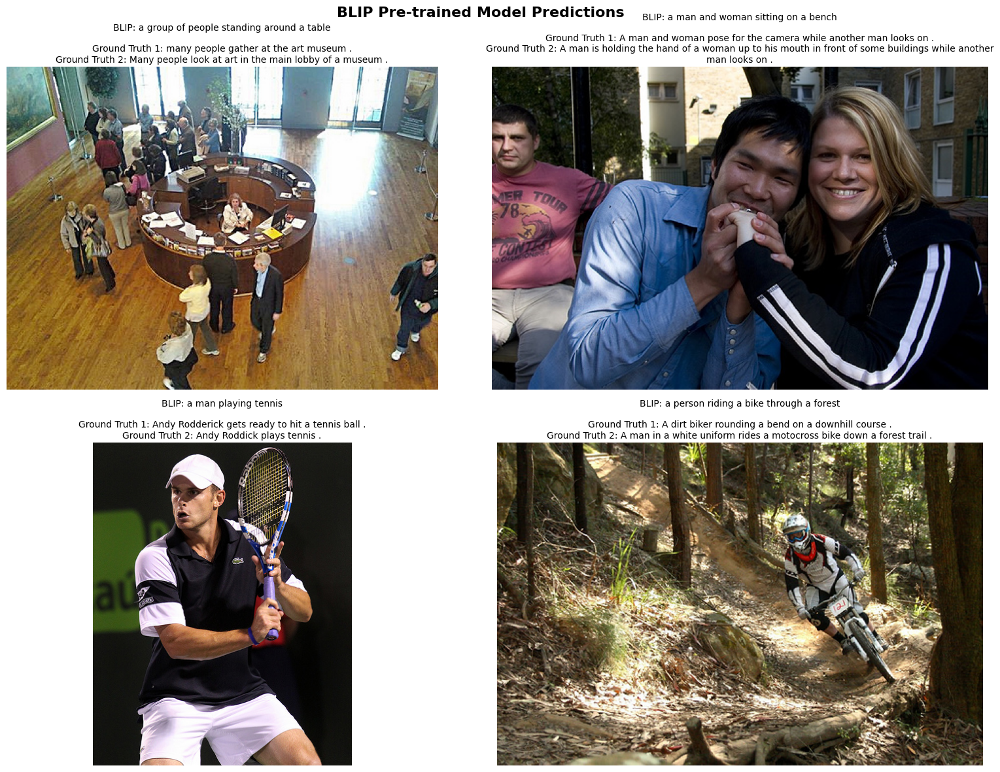


Pre-trained model loaded and tested successfully!


In [ ]:
from transformers import BlipProcessor, BlipForConditionalGeneration
from PIL import Image

# Load BLIP model and processor
print("Loading BLIP model from HuggingFace...")
pretrained_processor = BlipProcessor.from_pretrained("Salesforce/blip-image-captioning-base")
pretrained_model = BlipForConditionalGeneration.from_pretrained("Salesforce/blip-image-captioning-base").to(device)
print("BLIP model loaded successfully!\n")

def generate_blip_caption(image_path, processor, model, max_length=50):
    """
    Generate caption using BLIP model

    Args:
        image_path: Path to image file
        processor: BLIP processor
        model: BLIP model
        max_length: Maximum caption length

    Returns:
        Generated caption string
    """
    # Load and preprocess image
    raw_image = Image.open(image_path).convert('RGB')

    # Process image
    inputs = processor(raw_image, return_tensors="pt").to(device)

    # Generate caption
    out = model.generate(**inputs, max_length=max_length)
    caption = processor.decode(out[0], skip_special_tokens=True)

    return caption


# Test BLIP on a few images
print("Testing BLIP on sample images:\n")

# Get a few test images
import random
test_im_idxs = random.sample(range(len(test_loader.dataset.images)), 4)
test_img_paths = []
for i in test_im_idxs:
    test_img_paths.append(test_loader.dataset.images[i])
fig, axes = plt.subplots(2, 2, figsize=(16, 12))
axes = axes.flatten()

for idx, img_path in enumerate(test_img_paths):
    # Generate caption with BLIP
    blip_caption = generate_blip_caption(img_path, pretrained_processor, pretrained_model)

    # Load image for display
    img = Image.open(img_path).convert("RGB")

    # Get ground truth from grouped dataframe
    img_name = os.path.basename(img_path)
    gt_captions = []
    for _, row in test_samples.iterrows():
        if row['image'] == img_name:
            gt_captions = row['caption'][:2]  # Show first 2 reference captions
            break

    # Plot
    axes[idx].imshow(img)
    axes[idx].axis('off')
    title = f"BLIP: {blip_caption}\n\n"
    if gt_captions:
        title += f"Ground Truth 1: {gt_captions[0]}\n"
        if len(gt_captions) > 1:
            title += f"Ground Truth 2: {gt_captions[1]}"
    axes[idx].set_title(title, fontsize=10, wrap=True)

    print(f"Image {idx + 1}: {blip_caption}")

plt.suptitle('BLIP Pre-trained Model Predictions', fontsize=16, fontweight='bold')
plt.tight_layout()
plt.show()

print("\nPre-trained model loaded and tested successfully!")

## **9. Evaluating the Existing Image Captioning Model**

For evaluation, apply the **same metrics** used in the assessment of your custom image captioning model to ensure a consistent and fair comparison.

In [ ]:
def evaluate_blip_on_test_set(processor, model, test_loader, grouped_test_df, vocabulary):
    """
    Evaluate BLIP model on test set using BLEU scores
    """
    model.eval()

    all_bleu1, all_bleu2, all_bleu3, all_bleu4 = [], [], [], []

    print("\nEvaluating BLIP on test set...\n")

    # Create a mapping from image name to all reference captions
    image_to_captions = {}
    for _, row in grouped_test_df.iterrows():
        img_name = row['image']
        captions = row['caption']
        # Preprocess captions
        processed_captions = []
        for cap in captions:
            processed = vocabulary.preprocess_string(cap)
            processed_captions.append(processed.split())
        image_to_captions[img_name] = processed_captions

    # Evaluate on a subset (to save time)
    num_samples = min(200, len(test_loader.dataset))

    for i in range(num_samples):
        img_path_full = test_loader.dataset.images[i]
        img_name = os.path.basename(img_path_full)

        # Generate caption with BLIP
        generated_caption = generate_blip_caption(img_path_full, processor, model)
        # Preprocess and tokenize
        generated_words = vocabulary.preprocess_string(generated_caption).split()

        # Get reference captions
        if img_name in image_to_captions:
            reference_captions = image_to_captions[img_name]

            # Calculate BLEU scores
            scores = calculate_bleu_scores(reference_captions, generated_words)

            all_bleu1.append(scores['BLEU-1'])
            all_bleu2.append(scores['BLEU-2'])
            all_bleu3.append(scores['BLEU-3'])
            all_bleu4.append(scores['BLEU-4'])

        if (i + 1) % 50 == 0:
            print(f"Processed {i + 1}/{num_samples} images...")

    # Calculate average BLEU scores
    avg_bleu1 = np.mean(all_bleu1)
    avg_bleu2 = np.mean(all_bleu2)
    avg_bleu3 = np.mean(all_bleu3)
    avg_bleu4 = np.mean(all_bleu4)

    print("\n" + "="*60)
    print("BLIP MODEL - TEST SET EVALUATION RESULTS")
    print("="*60)
    print(f"Average BLEU-1: {avg_bleu1:.4f}")
    print(f"Average BLEU-2: {avg_bleu2:.4f}")
    print(f"Average BLEU-3: {avg_bleu3:.4f}")
    print(f"Average BLEU-4: {avg_bleu4:.4f}")
    print("="*60)

    return {
        'BLEU-1': avg_bleu1,
        'BLEU-2': avg_bleu2,
        'BLEU-3': avg_bleu3,
        'BLEU-4': avg_bleu4
    }


# Evaluate BLIP model
pretrained_model_scores = evaluate_blip_on_test_set(
    pretrained_processor,
    pretrained_model,
    test_loader,
    test_samples,
    vocabulary
)


Evaluating BLIP on test set...

Processed 50/200 images...
Processed 100/200 images...
Processed 150/200 images...
Processed 200/200 images...

BLIP MODEL - TEST SET EVALUATION RESULTS
Average BLEU-1: 0.5572
Average BLEU-2: 0.3833
Average BLEU-3: 0.2489
Average BLEU-4: 0.1809


## **10. Comparing the Two Models**

Compare the performance of both models using **BLEU-1, BLEU-2, BLEU-3, and BLEU-4** scores. Visualize predictions from both models on the **same batch of test images** to highlight their differences.

Analyze and justify the differences in performance, discussing factors such as model architecture, attention mechanisms, and training strategies. Finally, **propose possible improvements for your custom model**.

> **Answer**:

Based on the BLEU scores, the custom ViT-LSTM captioning model outperforms the BLIP model across all n-gram levels (BLEU-1 to BLEU-4). This indicates that the custom model is better at selecting relevant individual words, forming short phrases, and producing longer n-gram sequences that align more closely with the reference captions in this dataset.

The likely reason is that the custom model is trained specifically on this dataset, whereas BLIP is a general-purpose vision-language model trained on broader data distributions. Consequently, BLIP performs slightly worse on this particular in-domain test set, despite being a stronger general-domain model.


1. Plotting BLEU Score Comparison:



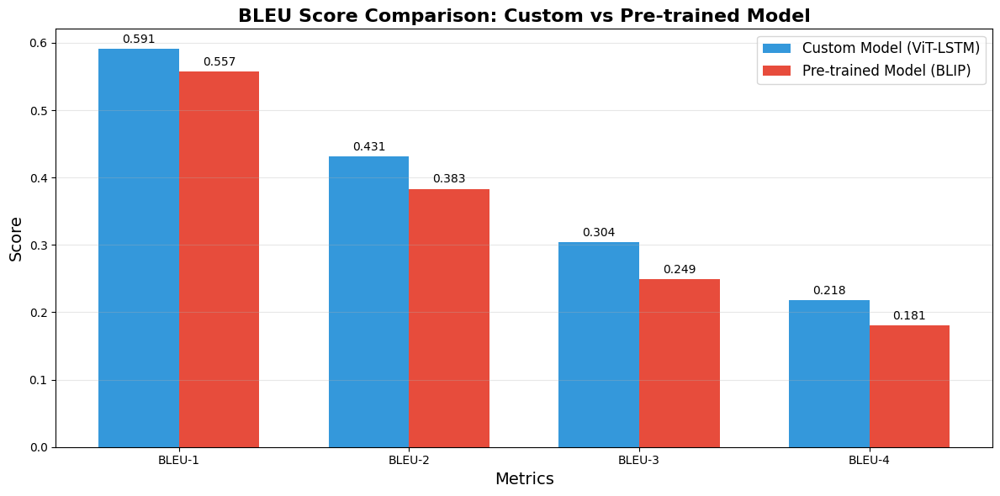


2. Comparing models on same test images:



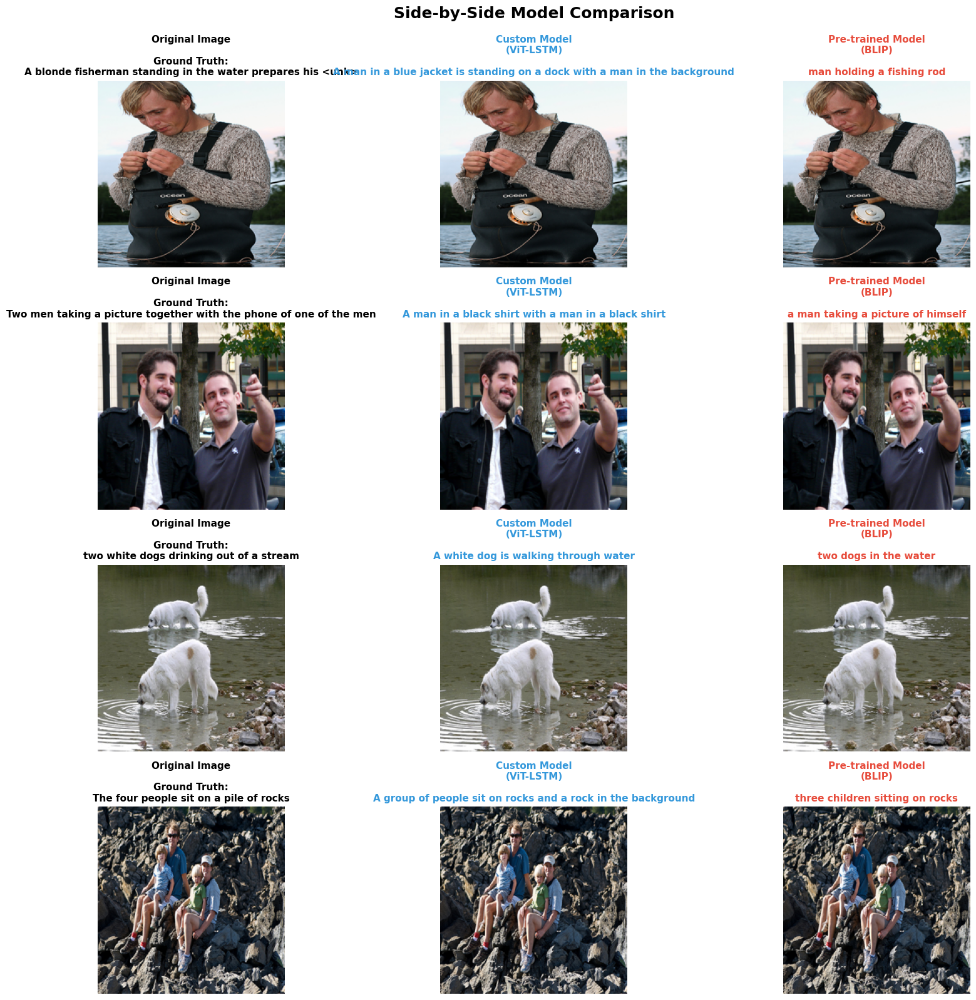


3. Detailed Analysis:


DETAILED PERFORMANCE ANALYSIS

 QUANTITATIVE COMPARISON:
--------------------------------------------------------------------------------
Metric          Custom Model         BLIP Model           Difference           Winner              
--------------------------------------------------------------------------------
BLEU-1          0.5912               0.5572               -0.0340              Custom
BLEU-2          0.4313               0.3833               -0.0480              Custom
BLEU-3          0.3044               0.2489               -0.0555              Custom
BLEU-4          0.2184               0.1809               -0.0375              Custom
--------------------------------------------------------------------------------

Average BLEU Score:
  Custom Model: 0.3863
  BLIP Model:   0.3426
  Improvement:  -11.32%


In [ ]:
# 1. Compare BLEU scores with a bar chart
def plot_bleu_comparison(custom_scores, pretrained_scores):
    """Plot BLEU score comparison between custom and pre-trained models"""
    metrics = ['BLEU-1', 'BLEU-2', 'BLEU-3', 'BLEU-4']
    custom_values = [custom_scores[m] for m in metrics]
    pretrained_values = [pretrained_scores[m] for m in metrics]

    x = np.arange(len(metrics))
    width = 0.35

    fig, ax = plt.subplots(figsize=(12, 6))
    bars1 = ax.bar(x - width/2, custom_values, width, label='Custom Model (ViT-LSTM)', color='#3498db')
    bars2 = ax.bar(x + width/2, pretrained_values, width, label='Pre-trained Model (BLIP)', color='#e74c3c')

    ax.set_xlabel('Metrics', fontsize=14)
    ax.set_ylabel('Score', fontsize=14)
    ax.set_title('BLEU Score Comparison: Custom vs Pre-trained Model', fontsize=16, fontweight='bold')
    ax.set_xticks(x)
    ax.set_xticklabels(metrics)
    ax.legend(fontsize=12)
    ax.grid(axis='y', alpha=0.3)

    # Add value labels on bars
    for bars in [bars1, bars2]:
        for bar in bars:
            height = bar.get_height()
            ax.annotate(f'{height:.3f}',
                       xy=(bar.get_x() + bar.get_width() / 2, height),
                       xytext=(0, 3),
                       textcoords="offset points",
                       ha='center', va='bottom', fontsize=10)

    plt.tight_layout()
    plt.show()


# 2. Side-by-side comparison on same images
def compare_models_on_images(custom_model, pretrained_processor, pretrained_model,
                             test_loader, vocabulary, mean, std, num_images=4):
    """
    Compare predictions from both models side-by-side on the same images
    """
    test_images, test_captions = next(iter(test_loader))

    fig, axes = plt.subplots(num_images, 3, figsize=(18, num_images * 4))

    if num_images == 1:
        axes = axes.reshape(1, -1)

    for idx, (test_images, test_captions) in enumerate(test_loader):
        if idx >= num_images:
            break
        img = test_images[idx]
        img_path = test_loader.dataset.images[idx + idx*test_images.size(0)]

        # Generate caption with custom model
        custom_words, _ = greedy_decode(custom_model, img, vocabulary)
        custom_caption = ' '.join(custom_words)

        # Generate caption with BLIP
        blip_caption = generate_blip_caption(img_path, pretrained_processor, pretrained_model)

        # Get ground truth caption
        gt_caption_tensor = test_captions[idx]
        gt_words = []
        for token in gt_caption_tensor:
            word = vocabulary.index2word[int(token)]
            if word == vocabulary.EOS_token:
                break
            if word not in [vocabulary.PAD_token, vocabulary.SOS_token]:
                gt_words.append(word)
        gt_caption = ' '.join(gt_words)

        # Denormalize image
        img_denorm = denormalize(img, mean, std)
        img_denorm = img_denorm.clamp(0, 1)
        img_np = np.transpose(img_denorm.cpu().numpy(), (1, 2, 0))

        # Plot - Original image
        axes[idx, 0].imshow(img_np)
        axes[idx, 0].axis('off')
        axes[idx, 0].set_title(f'Original Image\n\nGround Truth:\n{gt_caption}',
                              fontsize=11, fontweight='bold')

        # Plot - Custom model prediction
        axes[idx, 1].imshow(img_np)
        axes[idx, 1].axis('off')
        axes[idx, 1].set_title(f'Custom Model\n(ViT-LSTM)\n\n{custom_caption}',
                              fontsize=11, color='#3498db', fontweight='bold')

        # Plot - BLIP prediction
        axes[idx, 2].imshow(img_np)
        axes[idx, 2].axis('off')
        axes[idx, 2].set_title(f'Pre-trained Model\n(BLIP)\n\n{blip_caption}',
                              fontsize=11, color='#e74c3c', fontweight='bold')

    plt.suptitle('Side-by-Side Model Comparison', fontsize=18, fontweight='bold', y=0.995)
    plt.tight_layout()
    plt.show()


# 3. Detailed analysis
def print_detailed_analysis(custom_scores, pretrained_scores):
    """Print detailed analysis of model performance"""
    print("\n" + "="*80)
    print("DETAILED PERFORMANCE ANALYSIS")
    print("="*80)

    print("\n QUANTITATIVE COMPARISON:")
    print("-" * 80)
    print(f"{'Metric':<15} {'Custom Model':<20} {'BLIP Model':<20} {'Difference':<20} {'Winner':<20}")
    print("-" * 80)

    for metric in ['BLEU-1', 'BLEU-2', 'BLEU-3', 'BLEU-4']:
        custom_val = custom_scores[metric]
        blip_val = pretrained_scores[metric]
        diff = blip_val - custom_val
        winner = "BLIP" if diff > 0 else "Custom"
        print(f"{metric:<15} {custom_val:<20.4f} {blip_val:<20.4f} {diff:<+20.4f} {winner}")

    print("-" * 80)

    # Calculate average improvement
    avg_custom = np.mean([custom_scores[m] for m in ['BLEU-1', 'BLEU-2', 'BLEU-3', 'BLEU-4']])
    avg_blip = np.mean([pretrained_scores[m] for m in ['BLEU-1', 'BLEU-2', 'BLEU-3', 'BLEU-4']])
    improvement = ((avg_blip - avg_custom) / avg_custom) * 100

    print(f"\nAverage BLEU Score:")
    print(f"  Custom Model: {avg_custom:.4f}")
    print(f"  BLIP Model:   {avg_blip:.4f}")
    print(f"  Improvement:  {improvement:+.2f}%")


# Run comparisons
print("\n1. Plotting BLEU Score Comparison:\n")
plot_bleu_comparison(custom_model_scores, pretrained_model_scores)

print("\n2. Comparing models on same test images:\n")
compare_models_on_images(model, pretrained_processor, pretrained_model,
                         test_loader, vocabulary, mean, std, num_images=4)

print("\n3. Detailed Analysis:\n")
print_detailed_analysis(custom_model_scores, pretrained_model_scores)

Please make sure to download your `.ipynb` file, and upload it to **Canvas** on time!

<img src="https://www.usatoday.com/gcdn/authoring/authoring-images/2023/08/25/USAT/70680172007-alertsm.png?crop=2099,1187,x0,y156" alt="1" border="0">



In [ ]:
from datetime import datetime, timedelta, timezone

deadline = datetime(2025, 11, 25, 23, 59, 0, tzinfo=timezone.utc)

def time_until_deadline():
    now = datetime.now(timezone.utc)
    remaining = deadline - now
    if remaining.total_seconds() <= 0:
        return "Time's up!"
    days = remaining.days
    hours, remainder = divmod(remaining.seconds, 3600)
    minutes, _ = divmod(remainder, 60)

    return f"{days} days, {hours} hours, {minutes} minutes"

print("Time left until submission:", time_until_deadline())

Time left until submission: 7 days, 5 hours, 31 minutes
